# **JB Link - Telco Churn Prediction**

## **Importing Libraries and Loading the Dataset**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
import math
import plotly.express as px
#import plotly.graph_objects as go
#import plotly.io as pio
import shap 
import eli5

from pandas_profiling import ProfileReport

from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_validate, StratifiedKFold, cross_val_score, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import (plot_roc_curve, roc_curve, auc, roc_auc_score, balanced_accuracy_score,
                            recall_score, accuracy_score, precision_score, f1_score, confusion_matrix, 
                            plot_confusion_matrix, classification_report)
from sklearn.cluster import KMeans

from kmodes.kprototypes import KPrototypes

from eli5.sklearn import PermutationImportance
from IPython.display import display

#from matplotlib import pyplot
from statistics import mean
from numpy import where
from collections import Counter

pd.options.mode.chained_assignment = None  # default='warn'

%matplotlib inline
plt.rcParams.update({'font.size': 14})

In [2]:
#Read dataset
df = pd.read_csv('telco_data_merged.csv')

## **Business Problem**

<p> JB Link is a small size telecom company located in the state of California that provides Phone and Internet services to customers on more than a 1,000 cities and 1,600 zip codes.</p>
<p> The company is in the market for just 6 years and has quickly grown by investing on infrastucture to bring internet and phone networks to regions that had poor or no coverage. </p>
<p> The company also has a very skilled sales team that is always performing well on attracting new customers. The number of new customers acquired in the past quarter represent 15% over the total customers. </p>
<p> However, by the end of this same period, only 43% of this customers stayed with the company and most of them decided on not renewing their contracts after a few months, meaning the customer churn rate is very high and the company is now facing a big challenge on retaining its customers. </p>
<p>The total customer churn rate during last quarter was around 27%, resulting in a decrease of almost 12% in the total number of customers. </p>
<p> The executive leadership of JB Link is aware that some competitors are investing on new technologies and on the expansion of their network coverage and they believe this is one of the main drivers of the high customer churn rate.</p>
<p>Therefore, as an action plan, they have decided to created a task force inside the company that will be responsible to work on a customer retention strategy.</p> 
<p>The task force will involve members from different areas of the company, including Sales, Finance, Marketing, Customer Service, Tech Support and a recent formed Data Science team. One of their main challenges will be to accurately identify the customers that are more likely to churn in the next months, understand their needs and expectations and act to offer customized deals and services that are able keep them with the company. </p>

The data science team will play a key role on this process and was assigned some very important tasks that will support on the decisions made by the other teams involved:
- Gather insights from the data to understand what is driving the high customer churn rate.
- Develop a Machine Learning model that can accurately predict the customers that are more likely to churn.
- Prescribe customized actions that could be taken in order to retain each of those customers.

<p>The Data Science team was given a dataset with a random sample of 7,043 customers with 47 variables that can help on this task.</p>

<p>The executives are aware that the cost of acquiring a new customer can be up to five times higher than the cost of retaining a customer, so they are expecting that the results of this project will save a lot of money to the company and make it grow again.</p>

In [3]:
#Business Problem
new_customers = df[df['Tenure in Months']<=3].shape[0]
new_customers_churn_rate = df[(df['Tenure in Months']<=3) & (df['Churn Value']==1)].shape[0] / new_customers
total_churn_rate = df[df['Churn Value']==1].shape[0] / df.shape[0]
new_vs_churn_balance = (new_customers - df[df['Churn Value']==1].shape[0]) / df.shape[0]
                   
print('Years in the Market:',df['Tenure in Months'].max()/12)
print('Cities Covered:', df['City'].unique().shape[0])
print('Zip Codes Covered:', df['Zip Code'].unique().shape[0])
print('Main Services: Phone and Internet')
print('Internet Types:', df['Internet Type'].unique())
print('Internet Service Expansions: Online Security, Online Backup, Device Protection, Premium Tech Support, Streaming (TV, Movies, Music), Unlimited Data')
print('Contract Types:', df['Contract'].unique())
#print('New Customers:', df[df['Tenure in Months']<=3].shape[0])
print('New Customers % of total:', round(new_customers / df.shape[0]*100,1),'%')
print('New Customers Churn Rate:',round(new_customers_churn_rate*100,1),'%')
#print('Churn:', df[df['Churn Value']==1].shape[0])
print('Total Churn Rate:',round(total_churn_rate*100,1),'%')
print('Customers New/Churn Balance:', round(new_vs_churn_balance*100,1),'%')

Years in the Market: 6.0
Cities Covered: 1106
Zip Codes Covered: 1626
Main Services: Phone and Internet
Internet Types: ['Fiber Optic' 'Cable' 'DSL' 'None']
Internet Service Expansions: Online Security, Online Backup, Device Protection, Premium Tech Support, Streaming (TV, Movies, Music), Unlimited Data
Contract Types: ['Month-to-Month' 'One Year' 'Two Year']
New Customers % of total: 14.9 %
New Customers Churn Rate: 56.8 %
Total Churn Rate: 26.5 %
Customers New/Churn Balance: -11.6 %


## **Exploratory Data Analysis & Preprocessing**
The purpose of data analysis is to explore. Exploration means try to understand what kind of data we have in our hands. Using EDA we try to get the answer to the following questions, like:
- What kind of data is this? (file format, volume of data, number of columns, metadata data of image/video/audio or some feedback in English or other languages, or tabular data, etc)
- How complex is this data?
- Is this data sufficient for meeting our ultimate goal, i.e. Model building?
- Are there any missing values? In the given dataset do we have complete information or some values are missing for some records or some columns?
- What are different independent and dependent fields?
- Is there any relationship between different independent variables of the dataset? If yes then how strong is that relationship?

<br>
<p><b>Resources:</b></p>
<a href="https://dasarpai.com/eda-feature-engineering-101/">EDA & Feature Engineering</a><br>

### EDA - Step 1 - Basic Exploration
On this first EDA step we will be taking a first look at the dataset to find some basic information like:
- Shape/Size (rows x columns)
- Dataset format
- Basic Statistics
- Column Names
- Data Types
- Missing values
- Unique values per column

In [4]:
#Dataset dimensions
df.shape

(7043, 46)

In [5]:
print(pd.DataFrame(df.columns))

                                    0
0                         Customer ID
1                   Referred a Friend
2                 Number of Referrals
3                    Tenure in Months
4                               Offer
5                       Phone Service
6   Avg Monthly Long Distance Charges
7                      Multiple Lines
8                    Internet Service
9                       Internet Type
10            Avg Monthly GB Download
11                    Online Security
12                      Online Backup
13             Device Protection Plan
14               Premium Tech Support
15                       Streaming TV
16                   Streaming Movies
17                    Streaming Music
18                     Unlimited Data
19                           Contract
20                  Paperless Billing
21                     Payment Method
22                     Monthly Charge
23              Total Regular Charges
24                      Total Refunds
25          

In [6]:
df.head()

,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,...,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
0,8779-QRDMV,No,0,1,None,No,0.00,No,Yes,Fiber Optic,...,34.023810,-118.156582,68701,1,5433,Competitor,Competitor offered more data,5,0,NaN
1,7495-OOKFY,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Cable,...,34.044271,-118.185237,55668,1,5302,Competitor,Competitor made better offer,5,0,NaN
2,1658-BYGOY,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,...,34.108833,-118.229715,47534,1,3179,Competitor,Competitor made better offer,1,0,NaN
3,4598-XLKNJ,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,...,33.936291,-118.332639,27778,1,5337,Dissatisfaction,Limited range of services,1,1,2.0
4,4846-WHAFZ,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Cable,...,33.972119,-118.020188,26265,1,2793,Price,Extra data charges,1,0,2.0


In [7]:
#Check Dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 46 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Referred a Friend                  7043 non-null   object 
 2   Number of Referrals                7043 non-null   int64  
 3   Tenure in Months                   7043 non-null   int64  
 4   Offer                              7043 non-null   object 
 5   Phone Service                      7043 non-null   object 
 6   Avg Monthly Long Distance Charges  7043 non-null   float64
 7   Multiple Lines                     7043 non-null   object 
 8   Internet Service                   7043 non-null   object 
 9   Internet Type                      7043 non-null   object 
 10  Avg Monthly GB Download            7043 non-null   int64  
 11  Online Security                    7043 non-null   objec

In [8]:
#Basic statistic metrics
df.describe()

,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Age,Number of Dependents,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,1834.000000
mean,1.951867,32.386767,22.958954,21.110890,65.538800,2280.381264,1.962182,278.499225,749.099262,46.509726,0.468692,93486.070567,36.197455,-119.756684,22139.603294,0.265370,4400.295755,1.338776,0.308107,3.005453
std,3.001199,24.542061,15.448113,20.948471,30.606805,2266.220462,7.902614,685.039625,846.660055,16.750352,0.962802,1856.767505,2.468929,2.154425,21152.392837,0.441561,1183.057152,1.430471,0.717514,1.256938
min,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,19.000000,0.000000,90001.000000,32.555828,-124.301372,11.000000,0.000000,2003.000000,0.000000,0.000000,1.000000
25%,0.000000,9.000000,9.210000,3.000000,35.890000,400.150000,0.000000,0.000000,70.545000,32.000000,0.000000,92101.000000,33.990646,-121.788090,2344.000000,0.000000,3469.000000,0.000000,0.000000,2.000000
50%,0.000000,29.000000,22.890000,17.000000,71.968000,1394.550000,0.000000,0.000000,401.440000,46.000000,0.000000,93518.000000,36.205465,-119.595293,17554.000000,0.000000,4527.000000,1.000000,0.000000,3.000000
75%,3.000000,55.000000,36.395000,28.000000,90.650000,3786.600000,0.000000,182.620000,1191.100000,60.000000,0.000000,95329.000000,38.161321,-117.969795,36125.000000,1.000000,5380.500000,2.000000,0.000000,4.000000
max,11.000000,72.000000,49.990000,94.000000,123.084000,8684.800000,49.790000,6477.000000,3564.720000,80.000000,9.000000,96150.000000,41.962127,-114.192901,105285.000000,1.000000,6500.000000,9.000000,6.000000,5.000000


In [9]:
#Check uniques and most common values
df.describe(include=['object']).T

,count,unique,top,freq
Customer ID,7043,7043,6177-PEVRA,1
Referred a Friend,7043,2,No,3821
Offer,7043,6,None,3877
Phone Service,7043,2,Yes,6361
Multiple Lines,7043,2,No,4072
Internet Service,7043,2,Yes,5517
Internet Type,7043,4,Fiber Optic,2291
Online Security,7043,2,No,5024
Online Backup,7043,2,No,4614
Device Protection Plan,7043,2,No,4621


In [10]:
#Check missing values
for col in df.columns:
    if df[col].isna().sum() > 0:
        print(col,':',df[col].isna().sum(), 'missing values')

Churn Category : 5174 missing values
Churn Reason : 5174 missing values
Customer Satisfaction : 5209 missing values


In [11]:
#Data types summary
df.dtypes.value_counts()

object     26
int64      11
float64     9
dtype: int64

### Preprocessing - Step 1 - Fill missing values and fix column types
After reviewing the basics of the dataset, it was possible to identify some incorrect data types and some columns with null values. On this first preprocessing step, we will be properly filling the nulls on our dataset and fixing the incorrect data types. 

#### Fixing Incorrect Data Types
Zip Code is the only column that appears to be classified with an incorrect data type. The system understands it is a float, however it should be stored as an object.

We are also going to convert our target variable "Churn Value" from int to boolean, since it represents a class.

In [12]:
#Convert Churn Value to bool
df["Churn Value"] = df["Churn Value"].apply(bool)

df['Zip Code'] = df['Zip Code'].apply(str)
df['Zip Code'].dtypes

dtype('O')

#### Filling Missing Values
There are three columns with null values in the Dataset: Churn Category, Churn Reason and Customer Satisfaction.

Customer Satisfaction is the only variable that is collected before the target variable (churn), the other two depend on the target variable to be collected.

To fill the blanks in Customer Satisfaction, instead of just using the mean, we will use some assumptions based on other features of our dataset, which are the Number of Referrals and the Product/Service issues reported:
- Add a new feature to the model that represents the frequency in which each customer makes a referral
- Assume that if a customer Referral Frequency is above average and the customer didn't report any issues in the last 3 months, this customer satisfaction is 5.
- Assume that if a customer Referral Frequency is above average and reported any issues in the last 3 months, this customer satisfaction is 4.
- Assume that if a customer Referred at least 1 friend and didn't report any issues in the last 3 months, this customer's satisfaction is also 4.
- Assume that if a customer Referral Frequency is below average and the customer reported Product/Service issues, this customer's satisfaction is 3.
- Assume that if a customer didn't refer a friend and didn't report Product/Service issues, this customer's satisfaction is 3.
- Assume that if a customer didn't refer a friend and reported 1 issue, this customer's satisfaction is 2.
- Assume that if a customer didn't refer a friend and reported more than 1 issue, this customer's satisfaction is 1.

In [13]:
cust_sat_mode = df['Customer Satisfaction'].mode()[0]
#Creating Referrals Frequency feature
df['Referral Frequency'] = df['Number of Referrals'] / (df['Tenure in Months']+1)
ref_freq_mean = df['Referral Frequency'].mean()
for i in range(df.shape[0]):
    if math.isnan(df['Customer Satisfaction'][i]):
        if df['Referral Frequency'][i] > ref_freq_mean and df['Product/Service Issues Reported'][i] == 0:
            df['Customer Satisfaction'][i] = 5
        elif df['Referral Frequency'][i] > ref_freq_mean and df['Product/Service Issues Reported'][i] != 0:
            df['Customer Satisfaction'][i] = 4
        elif df['Referred a Friend'][i] == 'Yes' and df['Product/Service Issues Reported'][i] == 0:
            df['Customer Satisfaction'][i] = 4
        elif df['Referred a Friend'][i] == 'Yes' and df['Product/Service Issues Reported'][i] > 0:
            df['Customer Satisfaction'][i] = 3
        elif df['Referred a Friend'][i] == 'No' and df['Product/Service Issues Reported'][i] == 0:
            df['Customer Satisfaction'][i] = 3
        elif df['Referred a Friend'][i] == 'No' and df['Product/Service Issues Reported'][i] == 1:
            df['Customer Satisfaction'][i] = 2
        elif df['Referred a Friend'][i] == 'No' and df['Product/Service Issues Reported'][i] > 1:
            df['Customer Satisfaction'][i] = 1

print('Null values remaining in Customer Satisfaction:',df['Customer Satisfaction'].isnull().sum())

Null values remaining in Customer Satisfaction: 0


### EDA - Step 2 - Understanding Customer Churn Reasons
The customer churn reason is collected every time a customer communicates their decision on interrupting or not renewing their contract with the company. Each reason is then fit into a predefined category. Since this information is collected after our target variable, we have to drop it from our dataset. But first, it is interesting to make some analysis over it and understand what are the main reasons customers decide to leave us:
- 45% of customer churn is related to Competitor offering better conditions like:
 - Better Devices (17%)
 - Better Offers (17%)
 - More Data (6%)
 - Higher Download Speed (5%)
- 17% of customer churn is related to bad attitude of support person (12%) or service provider (5%)
- 16% of customer churn is related to disatisfaction with products and services
- 11% of customer churn is related to high prices

In [14]:
churn_cols = ['Churn Category', 'Churn Reason']

for col in churn_cols:
    df_plot = df[df['Churn Value']==1].groupby([col]).agg({'Churn Value': 'sum'})
    df_plot['Percentage'] = df_plot.apply(lambda x: x / float(x.sum()))
    df_plot = df_plot.sort_values('Percentage', ascending=True)
    df_plot = df_plot.reset_index()
    fig = px.bar(df_plot, y=col, x='Percentage', orientation='h',
                text=df_plot['Percentage'].apply(lambda x: '{0:1.0f}%'.format(x*100)),
                width=800, height=800,)
    fig.update_layout(title_text='<b>'+col+'</b>', title_x=0.5, title_font_size=24, font_size = 16,
                      yaxis_title="", xaxis_title="", legend_font_family="Barlow Semi Condensed")
    fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        })
    fig.update_traces(marker_color='navy')
    fig.layout.xaxis.tickformat = '.0%'
    display(fig)

### Preprocessing - Step 2 - Encoding and Droping Irrelevant Columns
On this second preprocessing step, a copy of the dataset will be made and some transformation steps will be applied to the dataset to convert categorical columns into numerical columns and to drop irrelevant features or features with a high cardinality (high number of unique values), as listed below:
- Convert Yes/No variables into binary.
- Use One Hot Encoding (get_dummies) on variables with 3 or more unique value.
- Drop irrelevant variables (Customer ID), attributes collected after the target value is collected (Churn Category and Churn Reason) and high cardinality variables (City and Zip Code)

This step is very important since some ML techniques that will be used can't read categorical variables.

<br>
<p><b>Resources:</b></p>
<a href="https://pbpython.com/categorical-encoding.html">Guide to Encoding Categorical Values in Python</a><br>
<a href="https://towardsdatascience.com/categorical-encoding-using-label-encoding-and-one-hot-encoder-911ef77fb5bd">Categorical encoding using Label-Encoding and One-Hot-Encoder</a><br>

In [15]:
#Create a copy of the dataset
df_encoded = df.copy()

#Drop irrelevant and high cardinality columns.
df_encoded = df_encoded.drop(['Customer ID', 'Churn Category', 'Churn Reason', 'Zip Code','City'], axis=1)

#Separate categorical "Yes/No" columns (those with 2 unique values), this will be treated as binary:
cat_cols_mult = [cname for cname in df_encoded.columns if df_encoded[cname].nunique() > 2 and 
                        df_encoded[cname].dtype == "object"]

cat_cols_bin = [cname for cname in df_encoded.columns if df_encoded[cname].nunique() == 2 and 
                        df_encoded[cname].dtype == "object"]

#Remove Gender from the list, this one follows a diferent logic ("Male/Female")
cat_cols_bin.remove('Gender')
    
# Select numerical columns
numerical_cols = [cname for cname in df_encoded.columns if df_encoded[cname].dtype in ['int64', 'float64']]

# Create label encoding for Gender (Male=1, Female=0) and rename column
df_encoded["Gender"] = np.where(df_encoded["Gender"].str.contains("Male"), 1, 0)
df_encoded["Gender"] = df_encoded["Gender"].apply(bool)
df_encoded = df_encoded.rename(columns={'Gender': 'Gender_Male'})

# Label encoding for "Yes/No" columns
for colname in df_encoded[cat_cols_bin]:
    df_encoded[colname] = df_encoded[colname] == 'Yes'

# Keep selected columns only
my_cols = cat_cols_bin + cat_cols_mult + numerical_cols + ['Gender_Male'] + ['Churn Value']
df_encoded = df_encoded[my_cols].copy()

# Label encoding for categoricals > 2, create dummies
for colname in df_encoded[cat_cols_mult]:
    df_encoded = pd.get_dummies(df_encoded, columns=[colname], dtype=bool)

In [16]:
bool_cols = [cname for cname in df_encoded.columns if df_encoded[cname].dtype in ['bool']]
df_encoded[bool_cols].head()

,Referred a Friend,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,...,Internet Type_Cable,Internet Type_DSL,Internet Type_Fiber Optic,Internet Type_None,Contract_Month-to-Month,Contract_One Year,Contract_Two Year,Payment Method_Bank Withdrawal,Payment Method_Credit Card,Payment Method_Mailed Check
0,False,False,False,True,False,False,True,False,False,True,...,False,False,True,False,True,False,False,True,False,False
1,True,True,True,True,False,True,False,False,False,False,...,True,False,False,False,True,False,False,False,True,False
2,False,True,True,True,False,False,False,False,True,True,...,False,False,True,False,True,False,False,True,False,False
3,True,True,False,True,False,True,True,False,True,True,...,False,False,True,False,True,False,False,True,False,False
4,True,True,True,True,False,False,False,False,False,False,...,True,False,False,False,True,False,False,True,False,False


### EDA - Step 3 - Profile Report
<p>Pandas profiling is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code. What it does is to save us all the work of visualizing and understanding the distribution of each variable by generating a report with all the information easily available.</p>
<p>The main disadvantage of pandas profiling is its use with large datasets. However, as our dataset is small, it shouldn't be an issue.</p>
<br>
<p><b>Resources:</b></p>
<a href="https://towardsdatascience.com/exploratory-data-analysis-with-pandas-profiling-de3aae2ddff3">Exploratory Data Analysis with Pandas Profiling</a>


In [17]:
profile = ProfileReport(df_encoded, title="Pandas Profiling Report")
#profile

### EDA - Step 4 - Categorical Variables vs Churn
In this step we will be plotting Stacked Bar charts to analyze our categorical variables and how they behave versus churn.

In [18]:
cat_cols = cat_cols_mult + cat_cols_bin

for col in cat_cols:
    df_plot = df.groupby([col, 'Churn Value']).size().reset_index()
    df_plot['percentage'] = df.groupby([col, 'Churn Value']).size().groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).values
    df_plot.columns = [col, 'Churn Value', 'Counts', 'Percentage']
    df_plot['Churn Value'] = df_plot['Churn Value'].apply(str)
    fig = px.bar(df_plot, x=col, y='Counts', width=600, height=400,
            color='Churn Value',
            color_discrete_map={'False': 'navy', 'True': 'orange'},
            text=df_plot['Percentage'].apply(lambda x: '{0:1.0f}%'.format(x)))
    fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        }, font_size = 14, yaxis_title="", xaxis_title="")
    fig.update_layout(title_text='Churn by '+col, title_x=0.5)
    display(fig)

### EDA - Step 5 - Numerical Variables vs Churn
In this step we will be plotting Histograms and Boxplot charts to analyze our numerical variables and how they behave versus churn.

In [19]:
for col in numerical_cols:
    fig = px.histogram(df,  x=col, 
                 color='Churn Value', marginal="box",
                color_discrete_map = {0:'navy',1:'orange'},
                 width=600, height=400,)
    fig.update_layout(title_text='', title_x=0.5)
    fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        }, font_size = 14, yaxis_title="")
    fig.show()

## Feature Engineering
The goal of feature engineering is simply to make your data better suited to the problem at hand.
Feature engineering can be performed to:
- Improve a model's predictive performance
- Reduce computational or data needs
- Improve interpretability of the results
<br><br>
<p><b>Resources:</b></p>
<a href="https://towardsdatascience.com/what-is-feature-engineering-bfd25b2b26b2">What is feature engineering? (Towards DS)</a><br>
<a href="https://www.kaggle.com/ryanholbrook/what-is-feature-engineering">What Is Feature Engineering (Kaggle)</a>


### Feature Engineering - Step 1 - Domain Expertise
We have already added a new feature to our dataset that was used to fill the missing values of Customer Satisfaction. Now, based on domain expertise, we can create some other features that might be useful:
- **Total Main Svcs**: Sum of Main Services (Phone and Internet)
- **Total Additional Svcs:** Sum of additional Services ('Multiple Lines','Online Security','Online Backup','Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Music','Unlimited Data')
- **Avg Monthly Charge per Main Svc:** Monthly charge divided by the number of main services
- **Avg Monthly Charge per Additional Svc:** Monthly charge divided by the number of additional services
- **Total Charges:** Sum of all charges minus refunds
- **Avg Charges:** Total Charges divided by Tenure
- **Avg Charges/Current Charge Ratio:** Comparison of Avg Charges vs current Monthly regular Charges
- **Avg Extra Data Charges:** Total Extra Data Charges divided by the Tenure
- **Avg Extra Data Charges per GB:** Avg Extra Data Charges divided Avg Monthly Download Rate
-**Extra Data Charges vs Avg Charges Ratio:** Average Monthly Extra Data Charges divided by Average Monthly Total Charges
- **Avg Extra Long Distance Charges per User:** Avg Long Distance charges divided by user + number of dependents (in case user uses multiple lines)
-**Extra Long Dist vs Avg Charges Ratio:** Average Monthly Long Distance Charges divided by Average Monthly Total Charges
- **Avg Charges per Household member:** Avg Charges divided by number of household members (user + partner + dependents)
- **Customer Svc Req per Main Svc Ratio:** Total Customer Service Requests by count of main products
- **Customer Svc Req per Additional Svc Ratio:** Total Customer Service Requests by count of additional products
- **Prod/Svc Issues per Customer Svc Request:** Count of issues reported divided by the total number of customer service requests
<br><br>
<p><b>Resources:</b></p>
<a href="https://www.kaggle.com/ryanholbrook/creating-features">Creating Features</a><br>

In [20]:
#Creating a copy of the encoded dataset
df_featured = df_encoded.copy()

In [21]:
df_featured['Total Main Svcs'] = df_featured[['Phone Service','Internet Service']].sum(axis=1)
df_featured['Total Additional Svcs'] = df_featured[['Multiple Lines','Online Security','Online Backup',
              'Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies',
              'Streaming Music','Unlimited Data']].sum(axis=1) + 1
df_featured['Avg Monthly Charge per Main Svc'] = df_featured['Monthly Charge'] / df_featured['Total Main Svcs']
df_featured['Avg Monthly Charge per Additional Svc'] = df_featured['Monthly Charge'] / df_featured['Total Additional Svcs']
df_featured['Total Charges'] = (df_featured['Total Regular Charges'] + df_featured['Total Extra Data Charges'] + 
                      df_featured['Total Long Distance Charges'] - df_featured['Total Refunds'])
df_featured['Avg Charges'] = df_featured['Total Charges'] / (df_featured['Tenure in Months']+1)
df_featured['Avg Charges/Current Charge Ratio'] = df_featured['Avg Charges'] / df_featured['Monthly Charge']
df_featured['Avg Extra Data Charges'] = df_featured['Total Extra Data Charges'] / (df_featured['Tenure in Months']+1)
df_featured['Avg Extra Data Charges per GB'] = (df_featured['Total Extra Data Charges'] /
                                               (df_featured['Avg Monthly GB Download']+0.01))
df_featured['Extra Data Charges vs Avg Charges Ratio'] = df_featured['Avg Extra Data Charges'] / df_featured['Avg Charges']
df_featured['Avg Extra Long Distance Charges per User'] = (df_featured['Avg Monthly Long Distance Charges'] /
                                                          (1+(df_featured['Multiple Lines']*df_featured['Number of Dependents'])))
df_featured['Extra Long Dist Charges vs Avg Charges Ratio'] = df_featured['Avg Monthly Long Distance Charges'] / df_featured['Avg Charges']
df_featured['Avg Charges per Household member'] = (df_featured['Avg Charges'] /
                                                  (1+df_featured['Number of Dependents']+df_featured['Married']))
df_featured['Customer Svc Req per Main Svc Ratio'] = df_featured['Total Customer Svc Requests'] / df_featured['Total Main Svcs']
df_featured['Customer Svc Req per Additional Svc Ratio'] = df_featured['Total Customer Svc Requests'] / df_featured['Total Additional Svcs']
df_featured['Prod/Svc Issues per Customer Svc Request'] = df_featured['Product/Service Issues Reported']/(df_featured['Total Customer Svc Requests']+1)


In [22]:
#Check null values on new features
for col in df_featured:
    if df_featured[col].isnull().sum() > 0:
        print(col, ':', df_featured[col].isnull().sum())

#Check null values on new features
for col in df_featured:
    if np.isinf(df_featured[col]).values.sum() > 0:
        print(col, ':', np.isinf(df_featured[col]).values.sum())

In [23]:
df_featured.shape

(7043, 70)

## Feature Selection
Feature selection is the process of identifying and selecting a subset of input features that are most relevant to the target variable, reducing the number of input variables when developing a predictive model.

It is desirable to reduce the number of input variables to both reduce the computational cost of modeling and, in some cases, to improve the performance of the model.
<br>
<p><b>Resources:</b></p>
<a href="https://machinelearningmastery.com/feature-selection-with-numerical-input-data/">How to Perform Feature Selection With Numerical Input Data</a><br>
<a href="https://towardsdatascience.com/select-features-for-machine-learning-model-with-mutual-information-534fe387d5c8">Select Features for Machine Learning Model with Mutual Information</a><br>
<a href="https://www.kaggle.com/ryanholbrook/mutual-information">Mutual Information</a><br>
<a href="https://machinelearningmastery.com/feature-selection-with-real-and-categorical-data/">How to Choose a Feature Selection Method For Machine Learning</a><br>
<a href="https://machinelearningmastery.com/information-gain-and-mutual-information/">Information Gain and Mutual Information for Machine Learning</a><br>



### Feature Selection - Step 1 - Mutual Information Analysis
After running the encoding process and adding the new numerical variables, the dataset ended up with 69 columns, 23 more than the original version. The next step is to reduce dimensionality by identifying variables that do not contribute to the final output. To identify those variables we will be using a technique called Mutual Information Analysis.

Mutual information is a lot like correlation in that it measures a relationship between two quantities. The advantage of mutual information is that it can detect any kind of relationship, while correlation only detects linear relationships.
Mutual information is a great general-purpose metric and especially useful at the start of feature development when you might not know what model you'd like to use yet.

After running the MI analysis on the encoded dataset, we set a threshold where all variabales with a MI score lower than 0.02 would be eliminated from the dataset.
<br>

In [24]:
#Separate Target Variable
y = df_featured['Churn Value']

#Drop any irrelevant data and features that are collected after customer has decided to leave the company
X = df_featured.drop(['Churn Value'], axis=1)

In [25]:
# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
mi_scores = pd.DataFrame(mi_scores).reset_index()

In [26]:
df_plot = mi_scores.reset_index().sort_values('MI Scores',ascending=False).head(20)
fig = px.bar(df_plot, y='index', x='MI Scores', orientation='h', text=round(df_plot['MI Scores'],2))
fig.update_layout(title_text='<b>MI Scores (Top 20)</b>', title_x=0.5, title_font_size=20, width=800, height=800,
                  yaxis_title="", xaxis_title="", barmode='stack', 
                  yaxis={'categoryorder':'total ascending'})
fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        }, font_size = 14)
fig.update_traces(marker_color='navy')
#fig.layout.xaxis.tickformat = '.0%'
display(fig)

In [27]:
#set MI threshold to drop variables
mi_threshold = 0.02

drop_cols = list(mi_scores['index'][mi_scores['MI Scores'] < mi_threshold])
print(drop_cols)
print(len(drop_cols))

['Age', 'Online Security', 'Avg Extra Data Charges', 'Offer_Offer A', 'Avg Charges per Household member', 'Premium Tech Support', 'Extra Long Dist Charges vs Avg Charges Ratio', 'Internet Type_Fiber Optic', 'Payment Method_Bank Withdrawal', 'Senior Citizen', 'Married', 'Referred a Friend', 'Unlimited Data', 'Streaming Music', 'Payment Method_Mailed Check', 'Under 30', 'Streaming Movies', 'Streaming TV', 'Avg Charges', 'Offer_None', 'CLTV', 'Online Backup', 'Offer_Offer B', 'Offer_Offer D', 'Phone Service', 'Device Protection Plan', 'Total Refunds', 'Internet Type_DSL', 'Avg Extra Long Distance Charges per User', 'Gender_Male', 'Avg Monthly Long Distance Charges', 'Offer_Offer C', 'Multiple Lines']
33


In [28]:
#create a new copy for selected dataframe
df_selected = df_featured.copy().drop(drop_cols, axis='columns')

In [29]:
df_selected.shape

(7043, 37)

### Feature Selection - Step 2 - Correlation
After aplying the MI analysis the number of variables in the dataset was reduced from 69 to 37. However, there is one more step that can be applied in order to reduce even more the dimensionality of the dataset, which is identifying linear correlations among the numerical variables. This step is important to eliminate redundant features.

We also have to set a threshold for the correlation coeficient to determine which columns to drop. In this case, we are assuming that variables with a correlation of 0.9 should be analyzed and only the variable with the highes MI (measures previously) should keep.

In [30]:
#Separating numerical from categorical
numerical_cols = [cname for cname in df_selected.columns if df_selected[cname].dtype in ['int64', 'float64']]
bool_cols = [cname for cname in df_selected.columns if df_selected[cname].dtype == "bool"]

<AxesSubplot:>

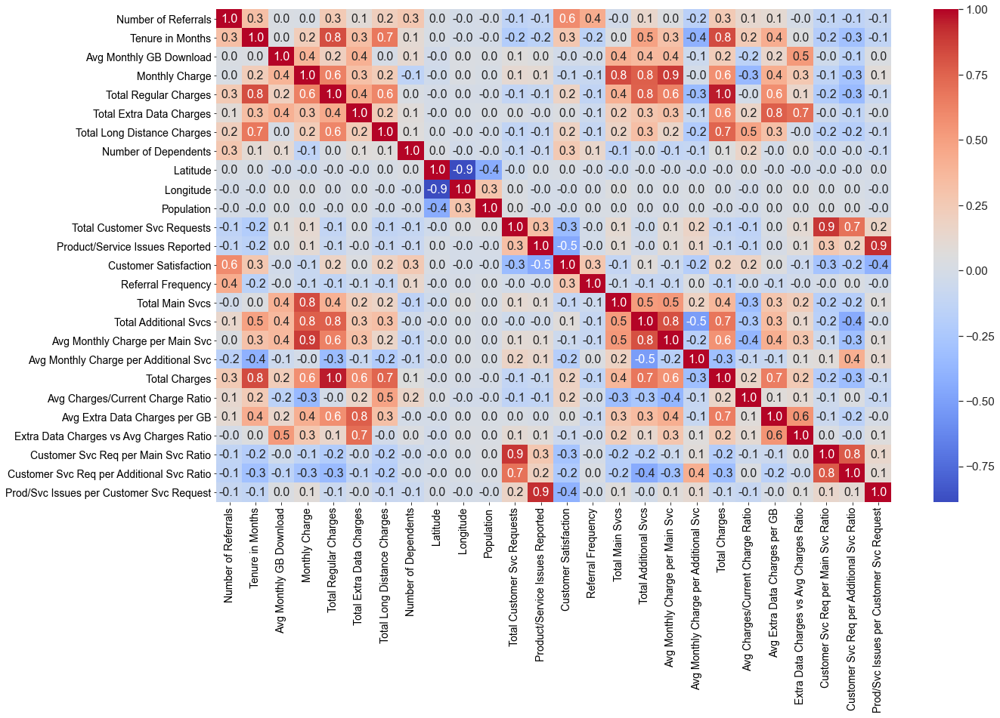

In [31]:
#Building a Correlation Matrix
corr = df_selected[numerical_cols].corr(method='pearson')
fig, ax = plt.subplots(figsize=(20,12))
sn.set(font_scale=1.4)
sn.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
           annot=True, fmt='.1f', annot_kws={"size": 16}, cmap="coolwarm", ax=ax)

In [32]:
#Building a dataframe to analyze highly correlated variables
corr_threshold = 0.9

corr2 = corr.reset_index().melt(id_vars=["index"], var_name="feature", value_name="Corr Coef")
corr2['Corr Coef'] = pd.to_numeric(corr2['Corr Coef'], errors='ignore')
corr2 = corr2[(abs(corr2['Corr Coef']) > corr_threshold) & (abs(corr2['Corr Coef']) < 1)]
corr2 = pd.merge(corr2,mi_scores,on='index',how='left').sort_values(['Corr Coef','MI Scores'], ascending = False)
corr2

,index,feature,Corr Coef,MI Scores
3,Total Regular Charges,Total Charges,0.960486,0.043391
0,Total Charges,Total Regular Charges,0.960486,0.029707
2,Prod/Svc Issues per Customer Svc Request,Product/Service Issues Reported,0.926185,0.094148
5,Product/Service Issues Reported,Prod/Svc Issues per Customer Svc Request,0.926185,0.074146
4,Total Customer Svc Requests,Customer Svc Req per Main Svc Ratio,0.903179,0.150566
1,Customer Svc Req per Main Svc Ratio,Total Customer Svc Requests,0.903179,0.117722


In [33]:
#Columns to drop
drop_cols2 = list(corr2['index'][1::2])
print(drop_cols2)
df_selected = df_selected.drop(drop_cols2, axis='columns')

['Total Charges', 'Product/Service Issues Reported', 'Customer Svc Req per Main Svc Ratio']


In [34]:
df_selected.shape

(7043, 34)

In [49]:
df_featured.shape

(7043, 70)

## Model Building - Step 1 - Creating Model Function
- Cross Validation Scores
- Oversampling (SMOTE) option
- Scaling option
- Confusion Matrix and ROC plots
- Permutatiom Importance
<br>
<p><b>Resources:</b></p>
<a href="https://machinelearningmastery.com/what-is-imbalanced-classification/">What is Imbalanced Classification</a><br>
<a href="https://neptune.ai/blog/cross-validation-in-machine-learning-how-to-do-it-right">Cross-Validation in Machine Learning: How to Do It Right</a><br>
<a href="https://www.analyticsvidhya.com/blog/2020/04/confusion-matrix-machine-learning/">Everything you Should Know about Confusion Matrix for Machine Learning</a><br>
<a href="https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/">SMOTE for Imbalanced Classification with Python</a><br>

In [35]:
def RM(model, data, scale=False, os=False, plots=False, permimp=False, folds=5):
    import warnings
    warnings.filterwarnings("ignore")
    
    #Separate Target Variable
    y = data['Churn Value']
    X = data.drop(['Churn Value'], axis=1)
    
    #run scaler if true
    if scale == True:
        X_num_cols = [cname for cname in X.columns if X[cname].dtype in ['int64', 'float64']]
        scaler = MinMaxScaler()
        X[X_num_cols] = scaler.fit_transform(X[X_num_cols])
    
    #KFold
    cv = StratifiedKFold(n_splits=folds, shuffle=True, random_state=0)
    
    #set scores list
    accuracy_list = []
    balanced_accuracy_list = []
    roc_auc_list = []
    recall_list = []
    precision_list = []
    f1_list = []
    
    
    #run CV
    for train_idx, test_idx, in cv.split(X, y):
        RM.train_X, RM.train_y = X.iloc[train_idx], y.iloc[train_idx]
        RM.test_X, RM.test_y = X.iloc[test_idx], y.iloc[test_idx]
        
        #oversampling minority class using SMOTE
        if os == True:
            oversample = SMOTE(random_state = 0)
            RM.train_X, RM.train_y = oversample.fit_resample(RM.train_X, RM.train_y)
            
        # Run Model
        model.fit(RM.train_X, RM.train_y)  
        pred_y = model.predict(RM.test_X)
        
        balanced_accuracy_list.append(balanced_accuracy_score(RM.test_y, pred_y))
        accuracy_list.append(accuracy_score(RM.test_y, pred_y))
        precision_list.append(precision_score(RM.test_y, pred_y))
        roc_auc_list.append(roc_auc_score(RM.test_y, model.predict_proba(RM.test_X)[:, 1]))
        recall_list.append(recall_score(RM.test_y, pred_y))
        f1_list.append(f1_score(RM.test_y, pred_y))
        
    print('Cross Validation Scores:')
    print('Accuracy:',round(mean(accuracy_list),2))
    print('Precision Score:', round(mean(precision_list),2))
    print('Recall Score:', round(mean(recall_list),2))
    print('F1 Score:', round(mean(f1_list),2))
    print('Balanced Accuracy:',round(mean(balanced_accuracy_list),2))
    print('ROC AUC:', round(mean(roc_auc_list),2))
  
    RM.pred_y = pd.DataFrame(index=RM.test_X.index)
    RM.pred_y['Churn Value'] = pred_y
    
    #Calculate cross Validation Scores
    #scores = {'accuracy':"accuracy", 'precision':"precision", 'recall':"recall",
              #'f1':'f1', 'roc_auc':'roc_auc', 'balanced_accuracy':'balanced_accuracy'}
    #score_list = cross_validate(model, X, y, scoring=scores, cv=10)
    #print('Cross Validation Scores:')
    #print(round(pd.DataFrame(score_list).mean(),2))
    
    #plot permutation importance
    RM.perm = PermutationImportance(model, random_state=0).fit(RM.test_X, RM.test_y)
    RM.explain = eli5.show_weights(RM.perm, 
                                    feature_names = RM.test_X.columns.tolist(),
                                    include_styles=False)
    if permimp == True:
        display(RM.explain)
    
    if plots == True:
        #Confusion Matrix and ROC plots
        fig, (ax1,ax2) = plt.subplots(1,2,figsize=(14,6))
        fig.suptitle('CM & ROC Curve Examples - '+model.__class__.__name__, fontsize=20)
        fig.patch.set_facecolor('#FFFFFF')
        #fig.add_axes()

        plt.figtext(0.14, 0.05, 'Recall: ' + str(round(recall_list[folds-1],2)), ha="left", fontsize=12, bbox={"facecolor":"lightblue", "alpha":0.5, "pad":5})
        plt.figtext(0.215, 0.05, 'Precision: ' + str(round(precision_list[folds-1],2)),  ha="left", fontsize=12, bbox={"facecolor":"lightblue", "alpha":0.5, "pad":5})
        plt.figtext(0.307, 0.05, 'Bal. Accuracy: ' + str(round(balanced_accuracy_list[folds-1],2)), ha="left", fontsize=12, bbox={"facecolor":"lightblue", "alpha":0.5, "pad":5})

        plot_confusion_matrix(model, RM.test_X, RM.test_y, cmap='Blues',ax=ax1)

        metrics.plot_roc_curve(model,RM.test_X, RM.test_y,ax=ax2)
        ax1.grid()
        ax2.axis(xmin=-0.02,ymax=1.02)
        plt.axis()
        plt.title('Receiver Operating Characteristic')
        plt.plot([0, 1], [0, 1],'r--')

## Model Building - Step 2 - Testing Different Models
- Random Forest
- Logistic Regression
- XGBoost
- KNN Classifier
- Naive Bayes
<br>
<p><b>Resources:</b></p>
<a href="https://www.datacamp.com/community/tutorials/k-nearest-neighbor-classification-scikit-learn">KNN Classification using Scikit-learn</a><br>
<a href="https://www.datacamp.com/community/tutorials/naive-bayes-scikit-learn">Naive Bayes Classification using Scikit-learn</a><br>
<a href="https://neptune.ai/blog/the-ultimate-guide-to-evaluation-and-selection-of-models-in-machine-learning">The Ultimate Guide to Evaluation and Selection of Models in Machine Learning</a><br>
<a href="https://medium.com/@hjhuney/implementing-a-random-forest-classification-model-in-python-583891c99652">Implementing a Random Forest Classification Model in Python</a><br>
<a href="https://scikit-learn.org/stable/modules/model_evaluation.html#precision-recall-f-measure-metrics">Metrics and scoring: quantifying the quality of predictions</a><br>






### **Random Forest**

In [55]:
rf_model = RandomForestClassifier(random_state = 0)
RM(rf_model, df_selected, scale=False, os=False, plots=False, permimp=False)

Cross Validation Scores:
Accuracy: 0.93
Precision Score: 0.91
Recall Score: 0.8
F1 Score: 0.85
Balanced Accuracy: 0.89
ROC AUC: 0.97


### **Logistic Regression**

Cross Validation Scores:
Accuracy: 0.92
Precision Score: 0.88
Recall Score: 0.82
F1 Score: 0.85
Balanced Accuracy: 0.89
ROC AUC: 0.97


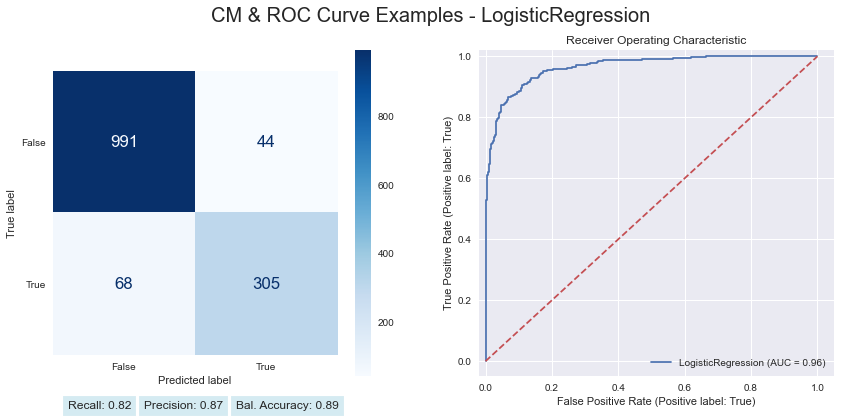

In [65]:
lr_model = LogisticRegression()
RM(lr_model, df_encoded, scale=True, os=False, plots=True)

### **XGBoost**

Cross Validation Scores:
Accuracy: 0.94
Precision Score: 0.9
Recall Score: 0.88
F1 Score: 0.89
Balanced Accuracy: 0.92
ROC AUC: 0.98


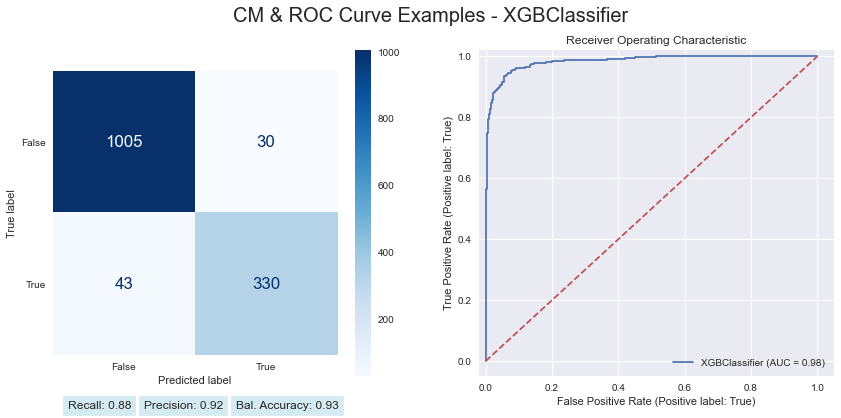

In [86]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier(eval_metric='error', random_state = 0)
RM(xgb_model, df_selected, scale=False, os=True, plots=True)

### **KNN Classifier**

In [77]:
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier()
RM(knn_model, df_encoded, scale=True, os=True, plots=False)

Cross Validation Scores:
Accuracy: 0.81
Precision Score: 0.6
Recall Score: 0.81
F1 Score: 0.69
Balanced Accuracy: 0.81
ROC AUC: 0.87


### **Naive Bayes**

In [85]:
from sklearn.naive_bayes import GaussianNB

nb_model = GaussianNB()
RM(nb_model, df_selected, scale=False, os=True, plots=False)

Cross Validation Scores:
Accuracy: 0.78
Precision Score: 0.55
Recall Score: 0.85
F1 Score: 0.67
Balanced Accuracy: 0.8
ROC AUC: 0.89


## Interpreting the Results

In [41]:
#Define model and dataset to interpret
model = xgb_model
data = df_selected

#run model
RM(model, data, scale=False, os=True, plots=False, permimp=False)

Cross Validation Scores:
Accuracy: 0.94
Precision Score: 0.9
Recall Score: 0.88
F1 Score: 0.89
Balanced Accuracy: 0.92
ROC AUC: 0.98


In [42]:
#Index list of Churn Predictions
pred_y = RM.pred_y.reset_index()
print(list(pred_y['index'][pred_y['Churn Value']==1]))

[4, 8, 10, 11, 12, 14, 20, 27, 30, 35, 45, 54, 55, 64, 72, 73, 74, 76, 92, 95, 96, 114, 119, 128, 130, 131, 138, 142, 144, 146, 147, 149, 153, 156, 160, 167, 171, 195, 197, 214, 217, 218, 221, 222, 230, 236, 240, 248, 249, 254, 257, 261, 266, 282, 283, 287, 290, 301, 323, 325, 333, 340, 344, 346, 348, 351, 353, 360, 374, 378, 382, 385, 401, 402, 404, 405, 411, 413, 419, 426, 430, 437, 447, 452, 459, 463, 473, 500, 792, 956, 963, 965, 1053, 1063, 1138, 1146, 1154, 1155, 1157, 1164, 1167, 1170, 1177, 1180, 1187, 1194, 1204, 1213, 1226, 1230, 1234, 1235, 1247, 1249, 1260, 1265, 1274, 1275, 1281, 1287, 1289, 1296, 1301, 1303, 1304, 1316, 1317, 1334, 1337, 1342, 1344, 1351, 1352, 1368, 1371, 1380, 1381, 1385, 1387, 1388, 1394, 1395, 1396, 1398, 1401, 1403, 1405, 1409, 1412, 1413, 1414, 1423, 1426, 1428, 1429, 1439, 1453, 1455, 1475, 1478, 1480, 1490, 1496, 1530, 1534, 1536, 1547, 1560, 1564, 1565, 1566, 1569, 1579, 1582, 1583, 1584, 1585, 1586, 1589, 1590, 1591, 1593, 1596, 1613, 1616, 1621

###  SHAP Technique
SHAP Values (an acronym from SHapley Additive exPlanations) break down a prediction to show the impact of each feature. Some examples where SHAP could be useful:
- A model says a bank shouldn't loan someone money, and the bank is legally required to explain the basis for each loan rejection
- A healthcare provider wants to identify what factors are driving each patient's risk of some disease so they can directly address those risk factors with targeted health interventions

In our case, we are predicting customer churn and we want to understand which factors are driving each customer's probability of churning, so our task force team can intervene by offering customized services and deals to them.
<br>
<p><b>Resources:</b></p>
<a href="https://github.com/slundberg/shap">SHAP Github</a><br>
<a href="https://www.kaggle.com/dansbecker/shap-values">SHAP Values</a><br>
<a href="https://www.kaggle.com/dansbecker/advanced-uses-of-shap-values">Advanced Uses of SHAP Values</a><br>

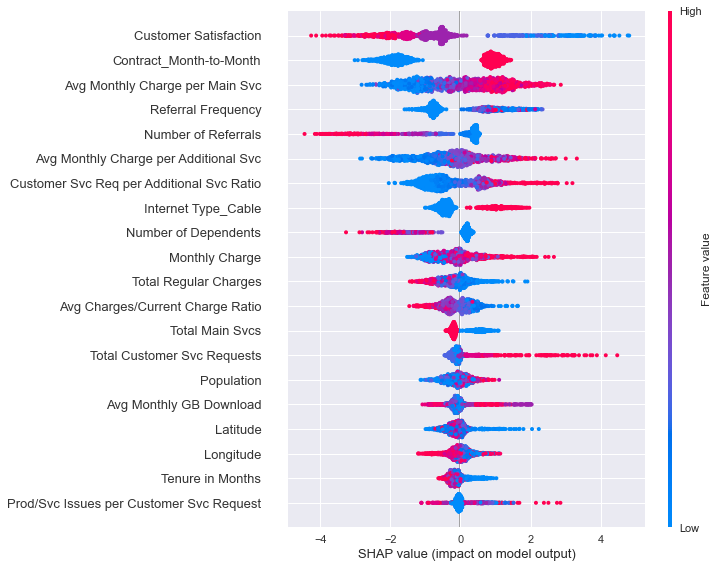

In [43]:
plt.style.use('seaborn')

# Create object that can calculate shap values
explainer = shap.TreeExplainer(model)

# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(RM.test_X)

# Make plot. Index of [1] is explained in text below.
if model == xgb_model:
    shap.summary_plot(shap_values, RM.test_X)
else:
    shap.summary_plot(shap_values[1], RM.test_X)

In [91]:
shap.initjs()

row_to_show = 114
data_for_prediction = RM.test_X.loc[row_to_show] 
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)


model.predict_proba(data_for_prediction_array)
k_explainer = shap.KernelExplainer(model.predict_proba, RM.train_X)
k_shap_values = k_explainer.shap_values(data_for_prediction, nsamples=100)
p = shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)
#shap.save_html('shap_id'+str(row_to_show)+'.html', p)
display(p)


Using 8278 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [92]:
for col in df_featured.columns:
    print(col,':',df_featured[col].loc[row_to_show])

Referred a Friend : True
Phone Service : False
Multiple Lines : False
Internet Service : True
Online Security : False
Online Backup : False
Device Protection Plan : False
Premium Tech Support : False
Streaming TV : True
Streaming Movies : True
Streaming Music : True
Unlimited Data : False
Paperless Billing : True
Under 30 : False
Senior Citizen : True
Married : True
Dependents : False
Number of Referrals : 1
Tenure in Months : 57
Avg Monthly Long Distance Charges : 0.0
Avg Monthly GB Download : 3
Monthly Charge : 46.644000000000005
Total Regular Charges : 2572.95
Total Refunds : 12.07
Total Extra Data Charges : 77.0
Total Long Distance Charges : 0.0
Age : 70
Number of Dependents : 0
Latitude : 34.167926
Longitude : -118.267539
Population : 21990
CLTV : 5172
Total Customer Svc Requests : 7
Product/Service Issues Reported : 0
Customer Satisfaction : 2.0
Referral Frequency : 0.017241379310344827
Gender_Male : True
Churn Value : True
Offer_None : True
Offer_Offer A : False
Offer_Offer B : 

### Permutation Importance


Python has a library called eli5 which can help us better understand trained models on why they make a particular prediction on a particular sample. This can help us better understand our model to know about important features as well as the reliability of the model.
<br>
<p><b>Resources:</b></p>
<a href="https://coderzcolumn.com/tutorials/machine-learning/how-to-use-eli5-to-understand-sklearn-models-their-performance-and-their-predictions">How to Use eli5 to Understand sklearn Models, their Performance, and their Predictions</a><br>
<a href="https://www.kaggle.com/dansbecker/permutation-importance">Permutation Importance</a><br>

In [46]:
#ELI5 Permutation for entire model
display(RM.explain)

Weight,Feature
0.0972 ± 0.0117,Customer Satisfaction
0.0510 ± 0.0120,Avg Monthly Charge per Main Svc
0.0507 ± 0.0080,Referral Frequency
0.0334 ± 0.0059,Number of Referrals
0.0281 ± 0.0055,Contract_Month-to-Month
0.0278 ± 0.0106,Avg Monthly Charge per Additional Svc
0.0243 ± 0.0043,Customer Svc Req per Additional Svc Ratio
0.0227 ± 0.0059,Monthly Charge
0.0134 ± 0.0006,Number of Dependents
0.0101 ± 0.0033,Prod/Svc Issues per Customer Svc Request


In [100]:
#Run ELI5 for individual customers
#row_to_show = 8

#explain = eli5.show_prediction(model, RM.test_X.loc[row_to_show],
                                #feature_names = RM.test_X.columns.tolist())
#display(explain)

ValueError: feature_names has a wrong length: expected=53, got=33

## Future Improvements:
<b>Multivariate analysis</b>

<b>Clustering</b>
- https://towardsdatascience.com/the-k-prototype-as-clustering-algorithm-for-mixed-data-type-categorical-and-numerical-fe7c50538ebb
- https://towardsdatascience.com/clustering-algorithm-for-data-with-mixed-categorical-and-numerical-features-d4e3a48066a0
- https://www.kaggle.com/ryanholbrook/clustering-with-k-means
- https://towardsdatascience.com/machine-learning-algorithms-part-9-k-means-example-in-python-f2ad05ed5203

<b>Other Models: LGBM, Catboost</b>

<b>PCA</b> 
- https://towardsdatascience.com/5-must-know-dimensionality-reduction-techniques-via-prince-e6ffb27e55d1
- https://www.kaggle.com/ryanholbrook/principal-component-analysis
- https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1006907

<b>Mean Encoding</b> 
- https://towardsdatascience.com/why-you-should-try-mean-encoding-17057262cd0

<b>Outlier Removal</b> 
- https://machinelearningmastery.com/how-to-use-statistics-to-identify-outliers-in-data/

<b>Hyperparametes Tunning</b>
- https://towardsdatascience.com/fine-tuning-xgboost-in-python-like-a-boss-b4543ed8b1e
- https://towardsdatascience.com/hyperparameter-tuning-c5619e7e6624